In [ ]:
problem statement
dataset
module
missing values

In [1]:
import os
import shutil
import pickle
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.svm import SVR
import plotly.express as ex
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import r2_score
from sklearn.decomposition import PCA
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV , RandomizedSearchCV
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.ensemble import BaggingRegressor , RandomForestRegressor , AdaBoostRegressor , GradientBoostingRegressor

In [2]:
path = "Desktop/Advance House Price Prediction"#
data_fetch_path = "Desktop/train.csv"#
data_test_path = "Desktop/test.csv"  #
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)

<ipython-input-2-1879f3f0ff8c>:7: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


In [3]:
try:
    if(os.path.isdir(path)):
        shutil.rmtree(path)
    os.mkdir(path)
    df = pd.read_csv(data_fetch_path)
    test_df = pd.read_csv(data_test_path)
    os.mkdir("Desktop/Advance House Price Prediction/Dataset")
    df.to_csv("Desktop/Advance House Price Prediction/Dataset/train.csv",index = False)
    test_df.to_csv("Desktop/Advance House Price Prediction/Dataset/test.csv", index = False)
except Exception as e:
    print(e)

In [4]:
try:
    print("  "*20+"Meta Data")
    print("=="*50)
    print("Information related to the dataset")
    print("=="*50)
    print(df.info())
    print("=="*50)
    print("Insights of the continuous features are")
    print("=="*50)
    print(df.describe())
    print("=="*50)
    print("Insights of the categorical features are")
    print("=="*50)
    print(df.describe(include="O"))
    print("=="*50)
    print("Adding Details to meta data file")
    file = open(path + "/meta_data.txt","w")
    file.write("  "*20 + " Meta Data ")
    file.write("\n"+"=="*50)
    file.write("\nInformation related to the dataset")
    file.write("\n"+"=="*50+"\n")
    df.info(buf=file)
    file.write("\n"+"=="*50)
    file.write("\nInsights of the continuous features are")
    file.write("\n"+"=="*50+"\n")
    file.write(str(df.describe()))
    file.write("\n"+"=="*50)
    file.write("\nInsights of the categorical features are")
    file.write("\n"+"=="*50+"\n")
    file.write(str(df.describe(include = "O")))
    file.write("\n"+"=="*50+"\n")
    file.close()
    print("\nDetails Added Successfully !!")
    print("=="*50)
except Exception as e:
    print(e)

                                        Meta Data
Information related to the dataset
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle 

In [5]:
try:
    print("=="*50)
    print("Features having Missing values")
    print("=="*50)
    print(df[df.dtypes.index[df.isnull().sum() !=0]].isnull().sum())
    print("=="*50)
    print("Missing values are processed")
    print("=="*50)
    print("Adding Missing values details in meta data file")
    file = open(path+"/meta_data.txt","a")
    file.write("Features having Missing values")
    file.write("\n"+"=="*50)
    file.write("\n"+str(df[df.dtypes.index[df.isnull().sum() !=0]].isnull().sum()))
    file.write("\n"+"=="*50)
    file.close()
    df.drop(df.dtypes.index[df.isnull().sum() > 1000], axis = 1, inplace=True)
    df["FireplaceQu"].fillna(value=df["FireplaceQu"].describe()["top"],inplace=True)
    df["LotFrontage"].fillna(value=df["LotFrontage"].mean(), inplace=True)
    df.dropna(inplace=True)
    print("\nDetails are added successfully")
    print("=="*50)
except Exception as e:
    print(e)

Features having Missing values
LotFrontage     259 
Alley           1369
MasVnrType      8   
MasVnrArea      8   
BsmtQual        37  
BsmtCond        37  
BsmtExposure    38  
BsmtFinType1    37  
BsmtFinType2    38  
Electrical      1   
FireplaceQu     690 
GarageType      81  
GarageYrBlt     81  
GarageFinish    81  
GarageQual      81  
GarageCond      81  
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64
Missing values are processed
Adding Missing values details in meta data file

Details are added successfully


Scatter Plots Visualization


<ipython-input-6-55b54fb50251>:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(dpi = 60)
<ipython-input-6-55b54fb50251>:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(dpi = 60)


<Figure size 2400x5600 with 0 Axes>

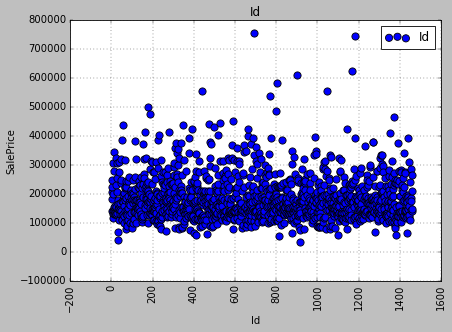

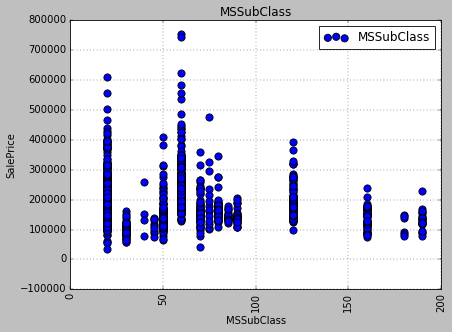

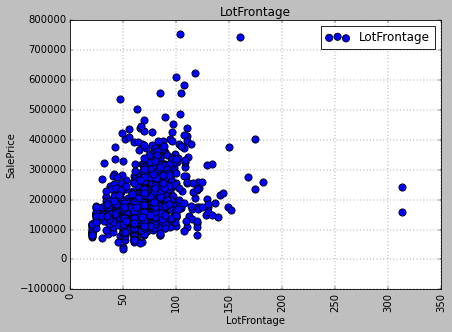

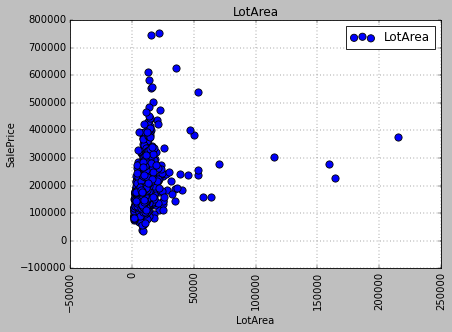

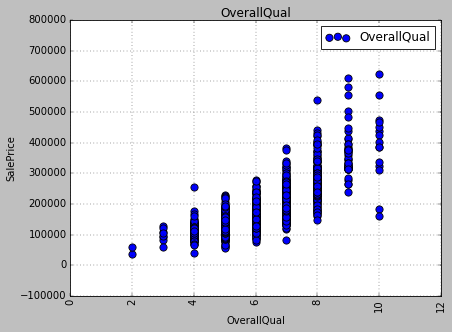

...

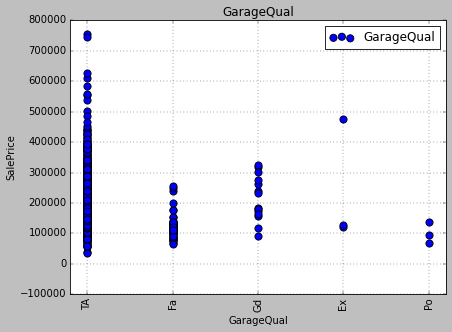

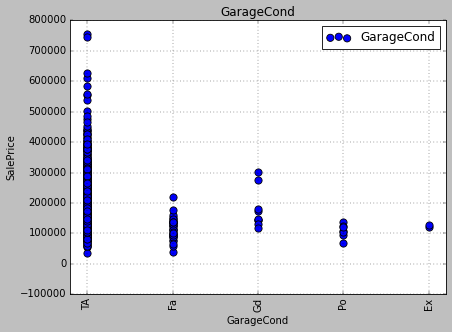

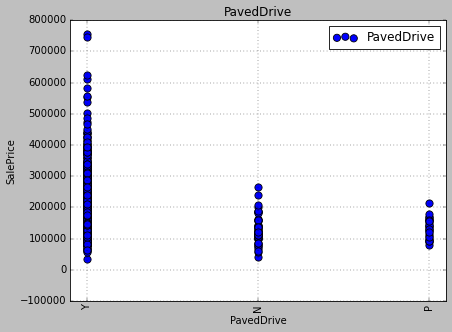

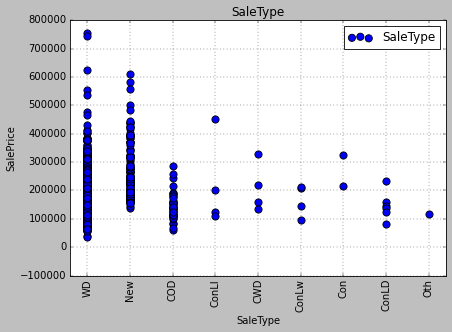

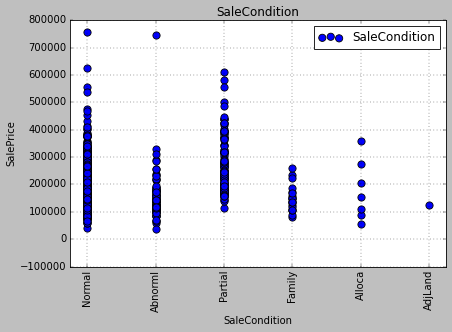

In [6]:
try:
    print("Scatter Plots Visualization")
    print("=="*50)
    plt.style.use('classic')
    fig = plt.figure(figsize=(30,70))
    if(os.path.isdir(path+"/plots")):
        shutil.rmtree(path+"/plots")
        os.mkdir(path+"/plots")
    else:
        os.mkdir(path+"/plots")
    if(os.path.isdir(path+"/plots/scatter_plot")):
        shutil.rmtree(path+"/plots/scatter_plot")
        os.mkdir(path+"/plots"+"/scatter_plot")
    else:
        os.mkdir(path+"/plots"+"/scatter_plot")
    for i in df.columns[df.dtypes != "object"]:
        if(i == "SalePrice"):
            continue
        plt.figure(dpi = 60)
        plt.scatter(df[i], df["SalePrice"],label=i,s=75)
        plt.xlabel(i)
        plt.ylabel("SalePrice")
        plt.title(i)
        plt.xticks(rotation = 90)
        plt.grid(True)
        plt.tight_layout(pad = 2)
        plt.legend()
        plt.savefig(path + "/plots/scatter_plot/"+str(i)+".png") 
        
    for i in df.columns[df.dtypes == "object"]:
        plt.figure(dpi = 60)
        plt.scatter(df[i], df["SalePrice"],label=i,s=75)
        plt.xlabel(i)
        plt.ylabel("SalePrice")
        plt.title(i)
        plt.xticks(rotation = 90)
        plt.grid(True)
        plt.tight_layout(pad = 2)
        plt.legend()
        plt.savefig(path + "/plots/scatter_plot/"+str(i)+".png") 
    print("=="*50)
except Exception as e:
    print(e)

Bar Plots Visualization


<ipython-input-7-9d66235de824>:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(dpi = 60)


<Figure size 2400x5600 with 0 Axes>

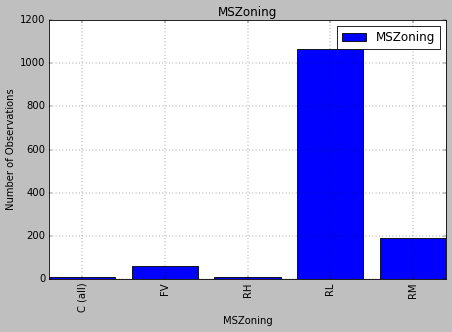

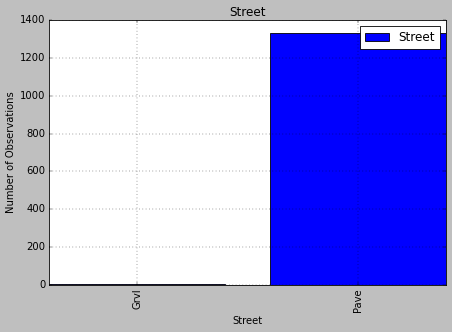

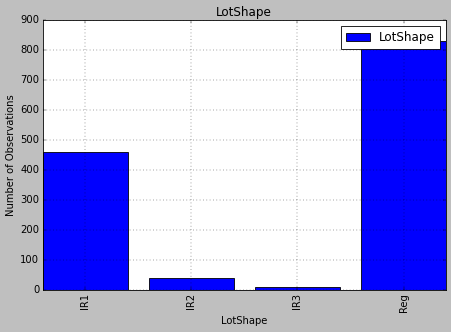

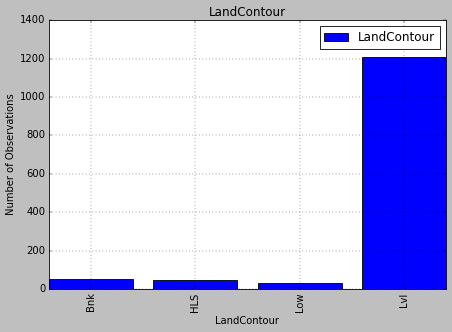

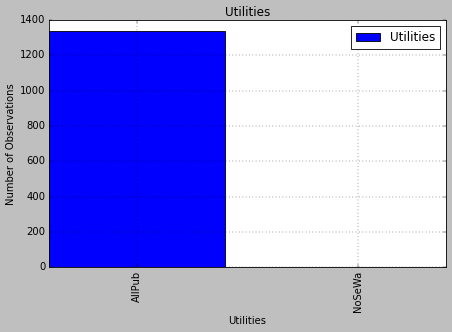

...

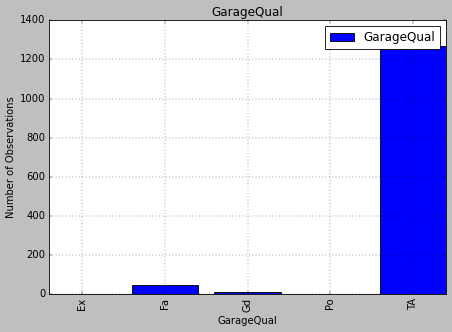

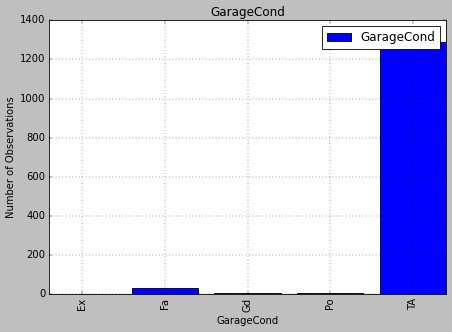

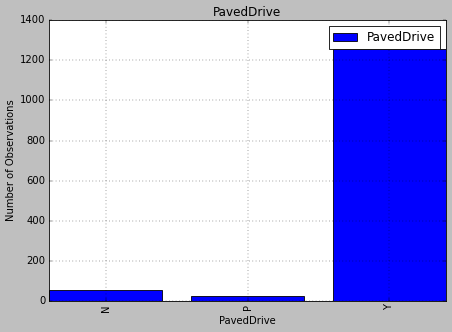

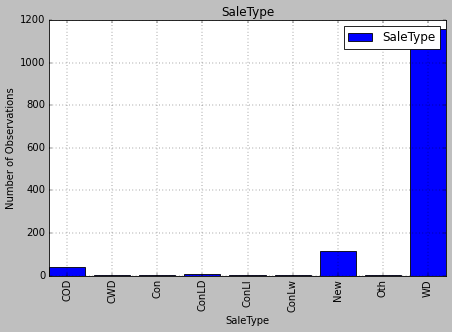

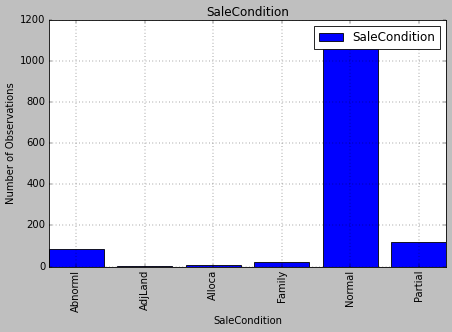

In [7]:
try:
    print("Bar Plots Visualization")
    print("=="*50)
    plt.style.use('classic')
    fig = plt.figure(figsize=(30,70))
    
    if(os.path.isdir(path+"/plots/bar_plot")):
        shutil.rmtree(path+"/plots/bar_plot")
        os.mkdir(path+"/plots"+"/bar_plot")
    else:
        os.mkdir(path+"/plots"+"/bar_plot")
        
    for i in df.columns[df.dtypes == "object"]:
        
        score = []
        for j in pd.Categorical(df[i]).categories:
            score.append((df[i] == j).sum())
        plt.figure(dpi = 60)
        plt.bar(pd.Categorical(df[i]).categories , score , label = i)
        plt.xlabel(i)
        plt.ylabel("Number of Observations")
        plt.title(i)
        plt.xticks(rotation = 90)
        plt.grid(True)
        plt.tight_layout(pad = 2)
        plt.legend()
        plt.savefig(path + "/plots/bar_plot/"+str(i)+".png") 
    print("=="*50)
except Exception as e:
    print(e)

Pie Plots Visualization


<ipython-input-8-7e19bb684194>:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(dpi = 60)


<Figure size 2400x5600 with 0 Axes>

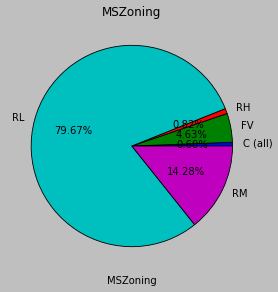

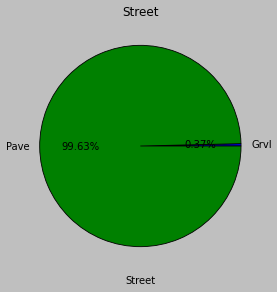

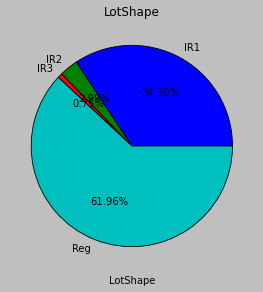

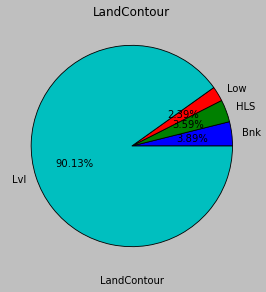

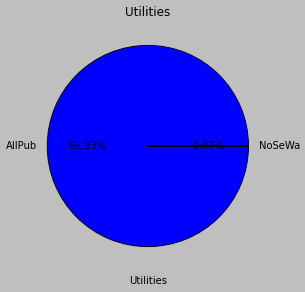

...

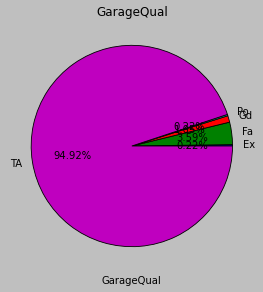

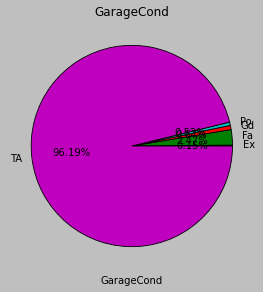

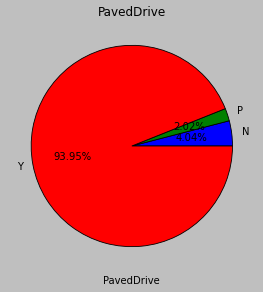

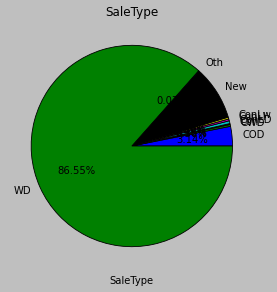

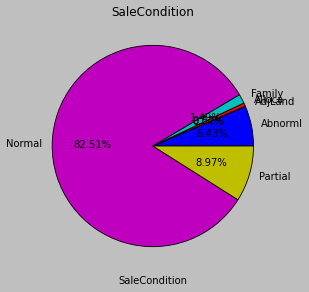

In [8]:
try:
    print("Pie Plots Visualization")
    print("=="*50)
    plt.style.use('classic')
    fig = plt.figure(figsize=(30,70))
    
    if(os.path.isdir(path+"/plots/pie_plot")):
        shutil.rmtree(path+"/plots/pie_plot")
        os.mkdir(path+"/plots"+"/pie_plot")
    else:
        os.mkdir(path+"/plots"+"/pie_plot")
        
    for i in df.columns[df.dtypes == "object"]:
        
        score = []
        for j in pd.Categorical(df[i]).categories:
            score.append((df[i] == j).sum())
        plt.figure(dpi = 60)
        plt.pie(score, labels=pd.Categorical(df[i]).categories , autopct='%1.2f%%')
        plt.xlabel(i)
        plt.title(i)
        plt.tight_layout(pad = 4)
        plt.savefig(path + "/plots/pie_plot/"+str(i)+".png") 
    print("=="*50)
except Exception as e:
    print(e)

Distribution Plots Visualization


/Users/santoshsaxena/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
/Users/santoshsaxena/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
/Users/santoshsaxena/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
<ipython-input-9-9edbda3b11e1>:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(dpi = 60)
<ipython-input-9-9edbda3b11e1>:14: RuntimeWarning: More than 20 fig

<ipython-input-9-9edbda3b11e1>:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(dpi = 60)


<Figure size 2400x5600 with 0 Axes>

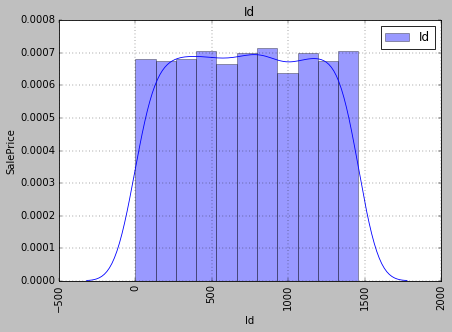

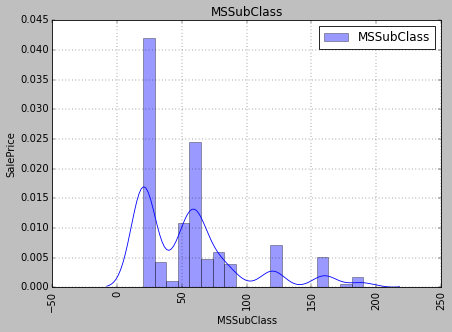

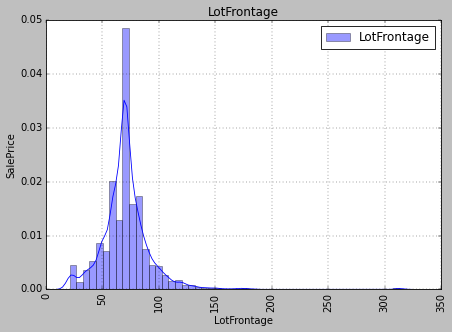

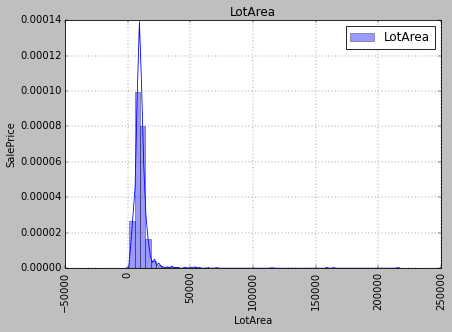

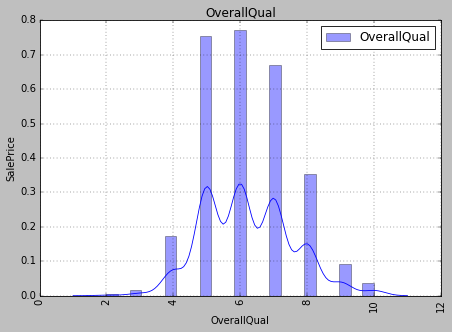

...

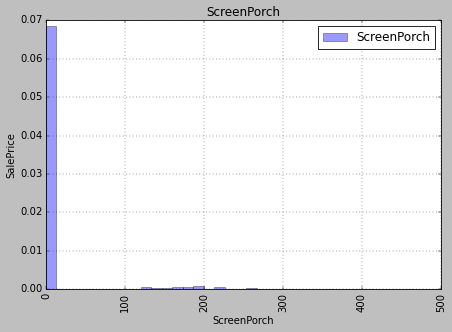

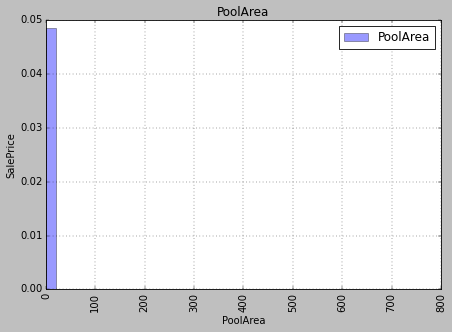

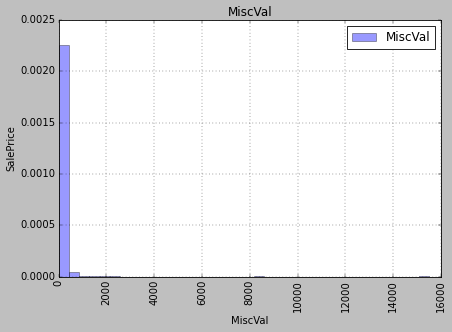

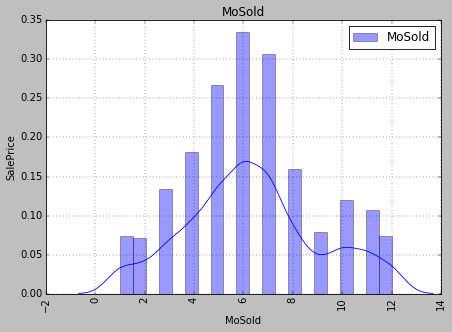

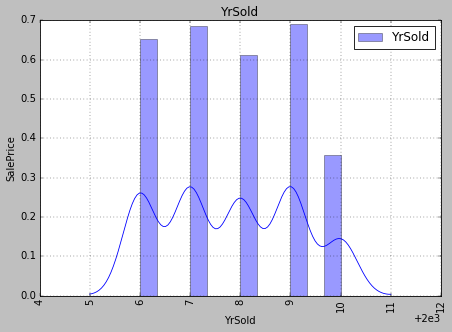

In [9]:

try:
    print("Distribution Plots Visualization")
    print("=="*50)
    plt.style.use('classic')
    fig = plt.figure(figsize=(30,70))
    if(os.path.isdir(path+"/plots/distribution_plot")):
        shutil.rmtree(path+"/plots/distribution_plot")
        os.mkdir(path+"/plots"+"/distribution_plot")
    else:
        os.mkdir(path+"/plots"+"/distribution_plot")
    for i in df.columns[df.dtypes != "object"]:
        if(i == "SalePrice"):
            continue
        plt.figure(dpi = 60)
        sns.distplot(df[i], label= i)
        plt.xlabel(i)
        plt.ylabel("SalePrice")
        plt.title(i)
        plt.xticks(rotation = 90)
        plt.grid(True)
        plt.tight_layout(pad = 2)
        plt.legend()
        plt.savefig(path + "/plots/distribution_plot/"+str(i)+".png")
    print("=="*50)
except Exception as e:
    print(e)

Box Plot Visualization


<ipython-input-10-240f252d7fde>:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(dpi = 60)
<ipython-input-10-240f252d7fde>:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(dpi = 60)
<ipython-input-10-240f252d7fde>:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(dpi = 60)
<ipython-input-1

<Figure size 2400x5600 with 0 Axes>

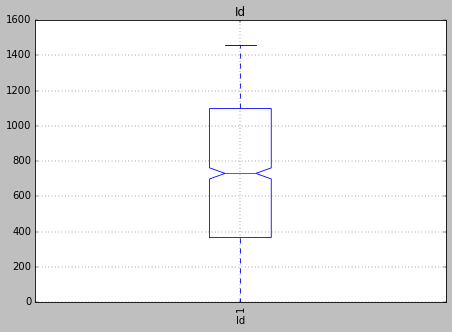

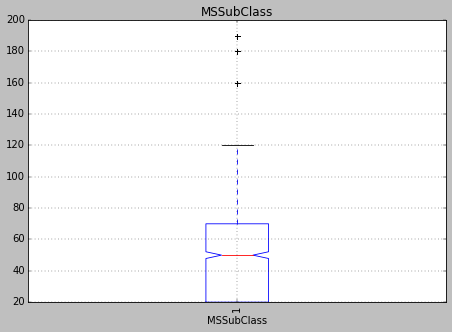

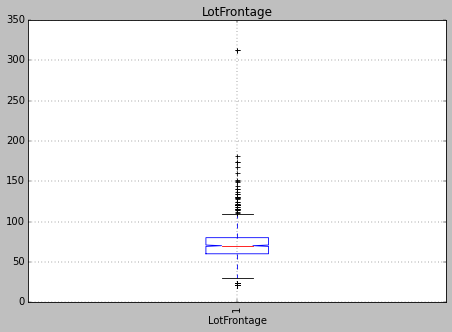

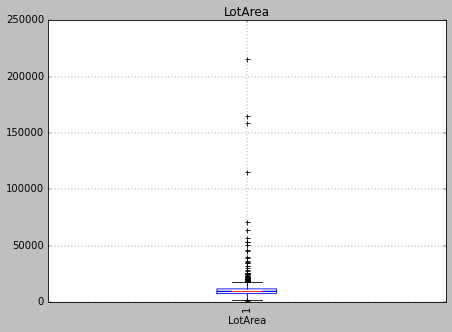

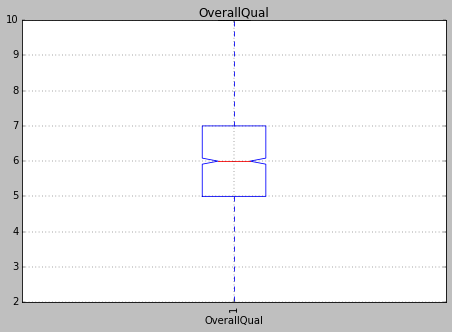

...

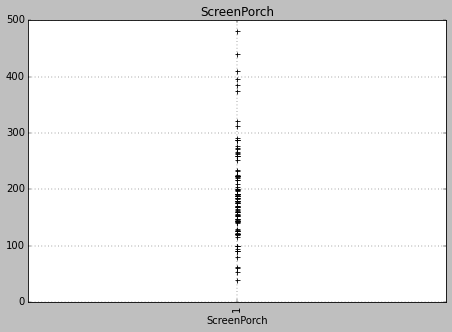

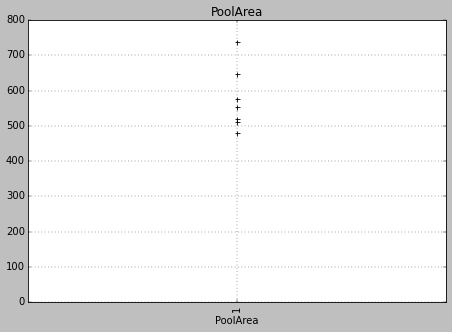

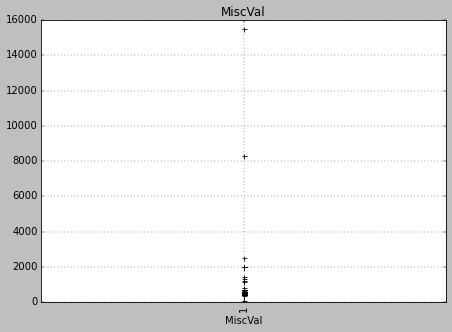

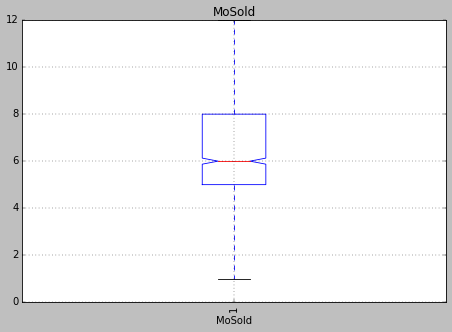

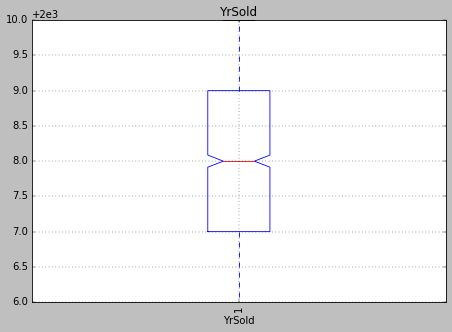

In [10]:
try:
    print("Box Plot Visualization")
    print("=="*50)
    plt.style.use('classic')
    fig = plt.figure(figsize=(30,70))
    if(os.path.isdir(path+"/plots/box_plot")):
        shutil.rmtree(path+"/plots/box_plot")
        os.mkdir(path+"/plots"+"/box_plot")
    else:
        os.mkdir(path+"/plots"+"/box_plot")
    for i in df.columns[df.dtypes != "object"]:
        if(i == "SalePrice"):
            continue
        plt.figure(dpi = 60)
        plt.boxplot(df[i],notch = True)
        plt.xlabel(i)
        plt.title(i)
        plt.xticks(rotation = 90)
        plt.grid(True)
        plt.tight_layout(pad = 2)
        plt.savefig(path + "/plots/box_plot/"+str(i)+".png")
    print("=="*50)
except Exception as e:
    print(e)

In [11]:
X = df.drop(["Id","SalePrice"], axis =1 )
y = df["SalePrice"]

In [12]:
try:
    print("=="*50)
    print("General look of dependent and independent features")
    print("=="*50)
    print("\nSample Observation\n")
    print("\nThe sample observations of Independent features are")
    print(X.head())
    print("\n\nThe sample observations of Dependent features are")
    print(y.head())
    print("\n"+"--"*50)
    print("\nShape of Independent and Independent variable")
    print("Shape of Independent feature is : ", X.shape)
    print("Shape of Dependent feature is : ",y.shape)
    print("\n"+"=="*50)
except Exception as e:
    print(e)
    

General look of dependent and independent features

Sample Observation


The sample observations of Independent features are
   MSSubClass MSZoning  LotFrontage  LotArea Street LotShape LandContour  \
0  60          RL       65.0         8450     Pave   Reg      Lvl          
1  20          RL       80.0         9600     Pave   Reg      Lvl          
2  60          RL       68.0         11250    Pave   IR1      Lvl          
3  70          RL       60.0         9550     Pave   IR1      Lvl          
4  60          RL       84.0         14260    Pave   IR1      Lvl          

  Utilities LotConfig LandSlope Neighborhood Condition1 Condition2 BldgType  \
0  AllPub    Inside    Gtl       CollgCr      Norm       Norm       1Fam      
1  AllPub    FR2       Gtl       Veenker      Feedr      Norm       1Fam      
2  AllPub    Inside    Gtl       CollgCr      Norm       Norm       1Fam      
3  AllPub    Corner    Gtl       Crawfor      Norm       Norm       1Fam      
4  AllPub    FR2       

In [13]:
try:
    print("=="*50)
    print("Data is not very much normally distributed and has outliers hence we will apply Standardization to the dataset")
    print("Refer Normal distribution and box plots to observe and visualize the nature of dataset")
    print("=="*50)
    sc = StandardScaler()
    columns = X[X.columns[X.dtypes != "object"]].columns[X[X.columns[X.dtypes != "object"]].max() > 10]
    X[X[X.columns[X.dtypes != "object"]].columns[X[X.columns[X.dtypes != "object"]].max() > 10]] = sc.fit_transform(X[X[X.columns[X.dtypes != "object"]].columns[X[X.columns[X.dtypes != "object"]].max() > 10]])
    print("These are the features which gets transformed on the basis of Standardization")
    print(columns)
    print("=="*50)
except Exception as e:
    print(e)

Data is not very much normally distributed and has outliers hence we will apply Standardization to the dataset
Refer Normal distribution and box plots to observe and visualize the nature of dataset
These are the features which gets transformed on the basis of Standardization
Index(['MSSubClass', 'LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd',
       'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'TotRmsAbvGrd',
       'GarageYrBlt', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold'],
      dtype='object')


In [14]:
X.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,0.093701,RL,-0.254147,-0.218363,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,1.014157,0.854216,Gable,CompShg,VinylSd,VinylSd,BrkFace,0.461582,Gd,TA,PConc,Gd,TA,No,GLQ,0.527157,Unf,-0.296255,-0.983421,-0.591875,GasA,Ex,Y,SBrkr,-0.828516,1.128813,-0.10374,0.331321,1,0,2,1,3,1,Gd,0.915080,Typ,0,Gd,Attchd,0.985427,RFn,2,0.249341,TA,TA,Y,-0.779554,0.202294,-0.349612,-0.118688,-0.283203,-0.071771,-0.084535,-1.605319,0.146084,WD,Normal
1,-0.876298,RL,0.422953,-0.107067,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,0.100528,-0.476562,Gable,CompShg,MetalSd,MetalSd,None,-0.594820,TA,TA,CBlock,Gd,TA,Gd,ALQ,1.120240,Unf,-0.296255,-0.678727,0.409598,GasA,Ex,Y,SBrkr,0.221935,-0.811389,-0.10374,-0.529579,0,1,2,0,3,1,TA,-0.347165,Typ,1,TA,Attchd,-0.104844,RFn,2,-0.222023,TA,TA,Y,1.557895,-0.731311,-0.349612,-0.118688,-0.283203,-0.071771,-0.084535,-0.493561,-0.605686,WD,Normal
2,0.093701,RL,-0.118727,0.052620,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,0.946480,0.804928,Gable,CompShg,VinylSd,VinylSd,BrkFace,0.278328,Gd,TA,PConc,Gd,TA,Mn,GLQ,0.047458,Unf,-0.296255,-0.337652,-0.434007,GasA,Ex,Y,SBrkr,-0.662928,1.156076,-0.10374,0.477367,1,0,2,1,3,1,Gd,-0.347165,Typ,1,TA,Attchd,0.904666,RFn,2,0.570726,TA,TA,Y,-0.779554,-0.088501,-0.349612,-0.118688,-0.283203,-0.071771,-0.084535,0.988784,0.146084,WD,Normal
3,0.336201,RL,-0.479847,-0.111906,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,-1.963596,-0.772291,Gable,CompShg,Wd Sdng,Wd Shng,None,-0.594820,TA,TA,BrkTil,TA,Gd,No,ALQ,-0.541263,Unf,-0.296255,-0.096626,-0.838543,GasA,Gd,Y,SBrkr,-0.556848,0.906167,-0.10374,0.344773,1,0,1,0,3,1,Gd,0.283958,Typ,1,Gd,Detchd,0.783525,Unf,3,0.752844,TA,TA,Y,-0.779554,-0.195636,4.122511,-0.118688,-0.283203,-0.071771,-0.084535,-1.605319,-1.357457,WD,Abnorml
4,0.093701,RL,0.603514,0.343926,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,0.912642,0.706352,Gable,CompShg,VinylSd,VinylSd,BrkFace,1.291612,Gd,TA,PConc,Gd,TA,Av,GLQ,0.415954,Unf,-0.296255,-0.210318,0.120996,GasA,Ex,Y,SBrkr,-0.080781,1.580921,-0.10374,1.269088,1,0,2,1,4,1,Gd,1.546203,Typ,1,TA,Attchd,0.864286,RFn,3,1.791989,TA,TA,Y,0.726453,0.554309,-0.349612,-0.118688,-0.283203,-0.071771,-0.084535,2.100542,0.146084,WD,Normal


In [15]:
try:
    print("=="*50)
    print("Categorical variable are processed and the categorical values are converted into numbers")
    print("=="*50)
    if(os.path.isdir(path+"/encoder")):
        shutil.rmtree(path+"/encoder")
        os.mkdir(path+"/encoder")
    else:
        os.mkdir(path + "/encoder")
    for i in X.columns[X.dtypes == "object"]:
        encoder = LabelEncoder()
        X[i] = encoder.fit_transform(X[i])
        pickle.dump(encoder, open(path + "/encoder/"+str(i)+".pickle","wb"))
except Exception as e:
    print(e)

Categorical variable are processed and the categorical values are converted into numbers


Checking correlation via heat map


Adding details to system
----------------------------------------------------------------------------------------------------


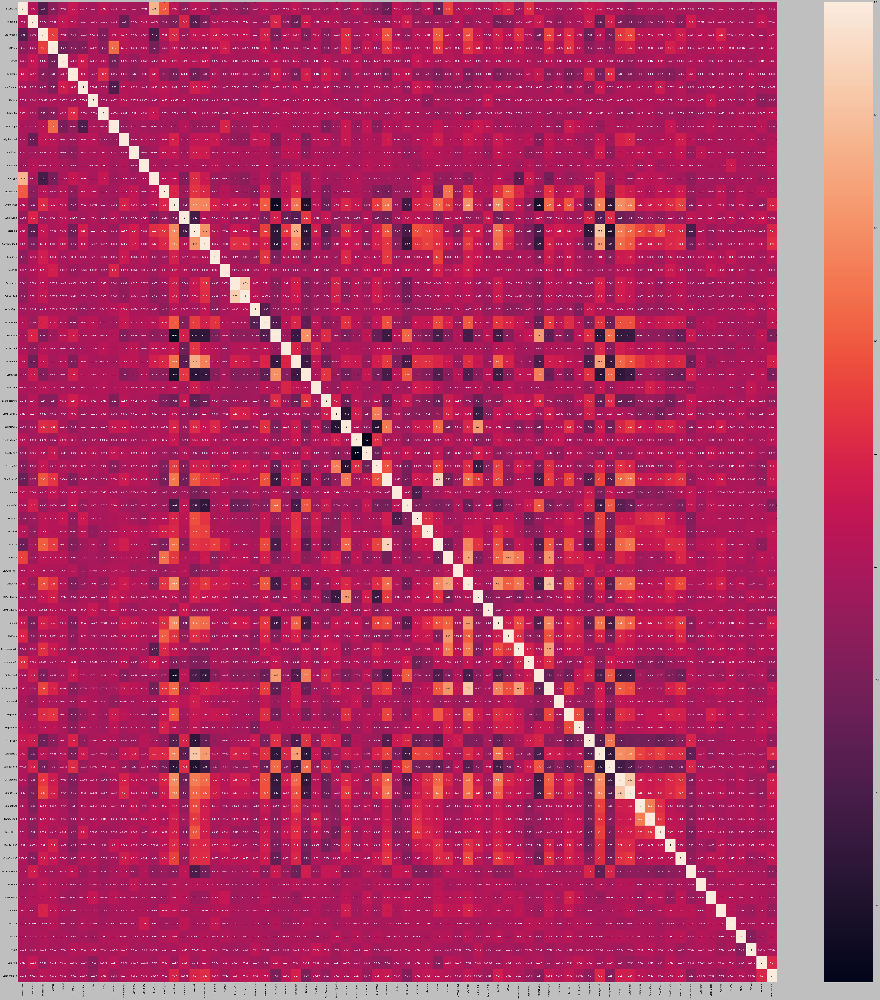

In [16]:
try:
    print("=="*50)
    print("Checking correlation via heat map")
    print("=="*50)
    print("\n\nAdding details to system")
    print("--"*50)
    plt.figure(figsize=(100,100))
    sns.heatmap(X.corr(),annot = True)
    plt.savefig(path + "/plots/correlation_heatmap.png")
except Exception as e:
    print(e)

In [17]:
try:
    print("=="*50)
    print("Multi-Collinearity Check")
    print("=="*50)
    print("These are the features who are correlated to each other")
    vif = []
    for i in range(len(X.columns)):
        vif.append(variance_inflation_factor(np.array(X),i))
    VIF = pd.DataFrame({"Features": X.columns , "Variance Inflation Factor":vif})
    print(VIF)
    print("=="*50)
    print("Removing Multi-Collinearity")
    print("=="*50)
    X["Derived_feature"] = X[VIF["Features"][VIF["Variance Inflation Factor"] > 5]].mean(axis = 1)
    X.drop(X[VIF["Features"][VIF["Variance Inflation Factor"] > 5]] , axis = 1, inplace = True)
    print("Features having high multi-collinearity is removed")
    print("=="*50)
    print("Processed Dataset details")
    print("\nThe Shape of Independent features are : ",X.shape)
    print("\n\nSamples of Independent features are ")
    print(X.head())
    print("=="*50)
    print("Adding these details in the metadata file")
    file = open(path+"/meta_data.txt","a")
    file.write("\nMulti-Collinearity details\n")
    file.write("=="*50)
    file.write(str(VIF))
    file.write("\n"+"=="*50)
    file.close()
    print("\nDetails added into metadata Successfull")
    print("=="*50)
    
except Exception as e:
    print(e)

Multi-Collinearity Check
These are the features who are correlated to each other


/Users/santoshsaxena/opt/anaconda3/lib/python3.8/site-packages/statsmodels/stats/outliers_influence.py:193: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


         Features  Variance Inflation Factor
0   MSSubClass     5.696214                 
1   MSZoning       33.039562                
2   LotFrontage    1.769526                 
3   LotArea        1.683025                 
4   Street         257.853119               
5   LotShape       3.508401                 
6   LandContour    22.816027                
7   Utilities      1.109152                 
8   LotConfig      5.008327                 
9   LandSlope      1.754448                 
10  Neighborhood   6.651391                 
11  Condition1     7.074180                 
12  Condition2     59.168331                
13  BldgType       5.748950                 
14  HouseStyle     8.479278                 
15  OverallQual    82.773301                
16  OverallCond    55.002060                
17  YearBuilt      8.869527                 
18  YearRemodAdd   3.028675                 
19  RoofStyle      4.974962                 
20  RoofMatl       4.997105                 
21  Exteri

In [18]:
try:
    print("=="*50)
    print("The shape of Independent variable i.e X is : ",X.shape)
    print("The shape of Dependent variable i.e y is   : ",y.shape)
    print("=="*50)
except Exception as e:
    print(e)

The shape of Independent variable i.e X is :  (1338, 29)
The shape of Dependent variable i.e y is   :  (1338,)


Dimensionality reduction
The original size of dataset is :  (1338, 29)
----------------------------------------------------------------------------------------------------


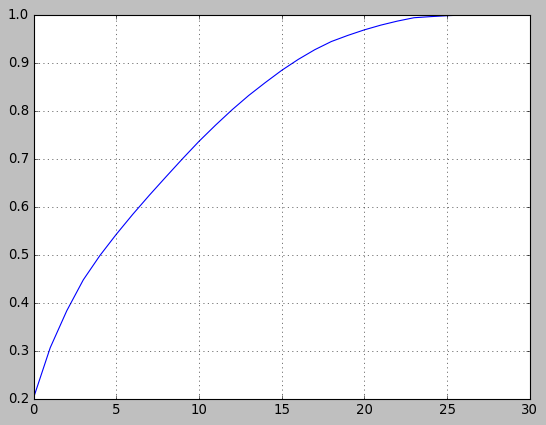

In [19]:
try:
    print("=="*50)
    print("Dimensionality reduction")
    print("=="*50)
    print("The original size of dataset is : ", X.shape)
    print("--"*50)
    pca = PCA(n_components= 29)
    pca.fit_transform(X)
    plt.plot(range(0,X.shape[1]),np.cumsum(pca.explained_variance_ratio_))
    plt.grid(True)
    plt.savefig(path + "/plots/dimensionality_reduction.png")
    plt.show()
except Exception as e:
    print(e)

In [20]:
try:
    print("=="*50)
    print("Dimensions reduced to 20")
    print("=="*50)
    pca = PCA(n_components=20)
    X = pca.fit_transform(X)
    X = pd.DataFrame(X)
except Exception as e:
    print(e)

Dimensions reduced to 20


In [21]:
x_train , x_test , y_train , y_test = train_test_split(X,y ,random_state = 101)

In [22]:
try:
    print("=="*50)
    print("Selecting Machine Learning Algorithm")
    print("=="*50)
    print("\nSelecting Base Algorithm")
    print("--"*50)
    print("\n\nLinear Regression")
    lr = LinearRegression()
    lr.fit(x_train , y_train)
    print("Accuracy of Linear Regression model is : " , lr.score(x_train, y_train))
    print("\n\nDecision Tree regressor")
    dt = DecisionTreeRegressor()
    dt.fit(x_train, y_train)
    print("Accuracy of Decision tree model is : ", dt.score(x_train, y_train))
    print("\n\nSupport Vector Regressor")
    sv = SVR()
    sv.fit(x_train , y_train)
    print("Accuracy of Support vector regressor is : ",sv.score(x_train , y_train))
    print("=="*50)
except Exception as e:
    print(e)

Selecting Machine Learning Algorithm

Selecting Base Algorithm
----------------------------------------------------------------------------------------------------


Linear Regression
Accuracy of Linear Regression model is :  0.6803600912930772


Decision Tree regressor
Accuracy of Decision tree model is :  1.0


Support Vector Regressor
Accuracy of Support vector regressor is :  -0.056298367802948945


In [23]:
try:
    print("=="*50)
    print("Selecting advance algorithm")
    print("=="*50)
    print("\n\nBagging")
    ba = BaggingRegressor(base_estimator=dt)
    ba.fit(x_train, y_train)
    print("Accuracy of Bagging is : ", ba.score(x_train , y_train))
    print("\n\nRandom Forest Regressor")
    ra = RandomForestRegressor()
    ra.fit(x_train , y_train)
    print("Accuracy of Random Forest Regressor is : ", ra.score(x_train , y_train))
    print("\n\nAdaBoost")
    ad = AdaBoostRegressor(base_estimator=dt)
    ad.fit(x_train, y_train)
    print("Accuracy of AdaBoost Regressor is : ", ad.score(x_train , y_train))
    print("\n\nGradientBoost")
    gb = GradientBoostingRegressor()
    gb.fit(x_train , y_train)
    print("Accuracy of Gradient Boost regressor is : ", gb.score(x_train , y_train))
    print("=="*50)
except Exception as e:
    print(e)

Selecting advance algorithm


Bagging
Accuracy of Bagging is :  0.934610928832335


Random Forest Regressor
Accuracy of Random Forest Regressor is :  0.9522319291717088


AdaBoost
Accuracy of AdaBoost Regressor is :  0.9986943998380773


GradientBoost
Accuracy of Gradient Boost regressor is :  0.9117702639163034


In [24]:
try:
    print("=="*50)
    dt = DecisionTreeRegressor()
    ad = AdaBoostRegressor(base_estimator=dt)
    ad.fit(x_train, y_train)
    print("Model accuracy with respect to train data : " , ad.score(x_train , y_train))
    print("Model accuracy with respect to test data : " , ad.score(x_test , y_test))
    print("=="*50)
except Exception as e:
    print(e)

Model accuracy with respect to train data :  0.9987011075477973
Model accuracy with respect to test data :  0.7406501426740895


In [25]:
try:
    print("=="*50)
    print("Fine Tunning")
    print("=="*50)
    parameters = {
        "learning_rate" : [0.001 ,0.01 , 0.1 , 1],
        "loss" : ['linear', 'square', 'exponential']
    }
    gr = GridSearchCV(ad , parameters , verbose=3)
    gr.fit(np.array(x_train), np.array(y_train))
    print("Best parameters are : ", gr.best_params_)
    print("=="*50)
except Exception as e:
    print(e)

Fine Tunning
Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV] learning_rate=0.001, loss=linear ................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] .... learning_rate=0.001, loss=linear, score=0.669, total=   0.7s
[CV] learning_rate=0.001, loss=linear ................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s remaining:    0.0s


[CV] .... learning_rate=0.001, loss=linear, score=0.624, total=   0.6s
[CV] learning_rate=0.001, loss=linear ................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.3s remaining:    0.0s


[CV] .... learning_rate=0.001, loss=linear, score=0.456, total=   0.7s
[CV] learning_rate=0.001, loss=linear ................................
[CV] .... learning_rate=0.001, loss=linear, score=0.661, total=   0.6s
[CV] learning_rate=0.001, loss=linear ................................
[CV] .... learning_rate=0.001, loss=linear, score=0.655, total=   0.6s
[CV] learning_rate=0.001, loss=square ................................
[CV] .... learning_rate=0.001, loss=square, score=0.679, total=   0.6s
[CV] learning_rate=0.001, loss=square ................................
[CV] .... learning_rate=0.001, loss=square, score=0.599, total=   0.6s
[CV] learning_rate=0.001, loss=square ................................
[CV] .... learning_rate=0.001, loss=square, score=0.569, total=   0.6s
[CV] learning_rate=0.001, loss=square ................................
[CV] .... learning_rate=0.001, loss=square, score=0.643, total=   0.7s
[CV] learning_rate=0.001, loss=square ................................
[CV] .

[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:   35.5s finished


Best parameters are :  {'learning_rate': 0.01, 'loss': 'exponential'}


In [26]:
try:
    print("=="*50)
    print("Fine Tunning")
    print("=="*50)
    parameters = {
        "learning_rate" : [0.001 ,0.01 , 0.1 , 1],
        "loss" : ['linear', 'square', 'exponential']
    }
    gr = GridSearchCV(ad , parameters , verbose=3)
    gr.fit(np.array(x_train), np.array(y_train))
    print("Best parameters are : ", gr.best_params_)
    print("=="*50)
except Exception as e:
    print(e)

Fine Tunning
Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV] learning_rate=0.001, loss=linear ................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] .... learning_rate=0.001, loss=linear, score=0.676, total=   0.7s
[CV] learning_rate=0.001, loss=linear ................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s remaining:    0.0s


[CV] .... learning_rate=0.001, loss=linear, score=0.593, total=   0.6s
[CV] learning_rate=0.001, loss=linear ................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.3s remaining:    0.0s


[CV] .... learning_rate=0.001, loss=linear, score=0.549, total=   0.6s
[CV] learning_rate=0.001, loss=linear ................................
[CV] .... learning_rate=0.001, loss=linear, score=0.666, total=   0.6s
[CV] learning_rate=0.001, loss=linear ................................
[CV] .... learning_rate=0.001, loss=linear, score=0.642, total=   0.6s
[CV] learning_rate=0.001, loss=square ................................
[CV] .... learning_rate=0.001, loss=square, score=0.681, total=   0.6s
[CV] learning_rate=0.001, loss=square ................................
[CV] .... learning_rate=0.001, loss=square, score=0.593, total=   0.6s
[CV] learning_rate=0.001, loss=square ................................
[CV] .... learning_rate=0.001, loss=square, score=0.577, total=   0.6s
[CV] learning_rate=0.001, loss=square ................................
[CV] .... learning_rate=0.001, loss=square, score=0.659, total=   0.7s
[CV] learning_rate=0.001, loss=square ................................
[CV] .

[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:   36.0s finished


Best parameters are :  {'learning_rate': 0.001, 'loss': 'exponential'}


In [27]:
try:
    print("=="*50)
    dt = DecisionTreeRegressor()
    ad = AdaBoostRegressor(base_estimator=dt, learning_rate=0.001 , loss="exponential")
    ad.fit(x_train , y_train)
    print("Accuracy for training data is : ",ad.score(x_train , y_train))
    print("Accuracy for test data is : ",ad.score(x_test , y_test))
    print("=="*50)
except Exception as e:
    print(e)

Accuracy for training data is :  0.9994841281051209
Accuracy for test data is :  0.7576925396117999


In [28]:
try:
    print("=="*50)
    print("R2 Score for training data is : " , r2_score(y_train , ad.predict(x_train)))
    print("R2 Score for test data is : ",r2_score(y_test , ad.predict(x_test)))
    print("=="*50)
except Exception as e:
    print(e)

R2 Score for training data is :  0.9994841281051209
R2 Score for test data is :  0.7576925396117999
